### Download & Import packages

---

In [ ]:
!apt install fluidsynth
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2
!pip install midi2audio
!pip install music21

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin libinput10
  libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5 libqt5gui5 libqt5network5
  libqt5svg5 libqt5widgets5 libwacom-bin libwacom-common libwacom9 libxcb-icccm4 libxcb-image0
  libxcb-keysyms1 libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1
  libxkbcommon-x11-0 qsynth qt5-gtk-platformtheme qttranslations5-l10n timgm6mb-soundfont
Suggested packages:
  fluid-soundfont-gs qt5-image-formats-plugins qtwayland5 jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin libinput10
  libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5 libqt5gui5 libqt5network5
  libqt5svg5 libqt5widgets5 libwacom-bin libwacom-common libwacom9 libxcb-icc

In [ ]:
pip install np_utils

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for np_utils: filename=np_utils-0.6.0-py3-none-any.whl size=56437 sha256=fc44d6bafe1cf4180b66d9ae1147f108835eca039828c55ebf3fcdee6e871238
  Stored in directory: /root/.cache/pip/wheels/b6/c7/50/2307607f44366dd021209f660045f8d51cb976514d30be7cc7
Successfully built np_utils


In [ ]:
import sys, os, glob
import pickle
import matplotlib.pyplot as plt
import numpy as np
from music21 import *
from midi2audio import FluidSynth
from IPython.display import Audio
from keras.layers import Input, Dense, Reshape, Dropout, LSTM, Bidirectional
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers import LeakyReLU
from keras.models import Sequential, Model
from keras.optimizers import Adam
import np_utils

### MIDI class

---

In [ ]:
class MIDI():
    def __init__(self, seq_length):
        self.seq_length = seq_length
        self.file_notes = []
        self.trainseq = []
        self.transfer_dic = dict()
        self.dic_n = 0

    def parser(self, folderName):

        for file in glob.glob(f"{folderName}/*.mid"):
            midi = converter.parse(file)
            print("Parsing %s" % file)

            notes = []
            for element in midi.flat.elements:
                if isinstance(element, note.Rest) and element.offset != 0:
                    notes.append('R')
                if isinstance(element, note.Note):
                    notes.append(str(element.pitch))
                if isinstance(element, chord.Chord):
                    notes.append('.'.join(str(pitch) for pitch in element.pitches))

            self.file_notes.append(notes)
        note_set = sorted(set(note for notes in self.file_notes for note in notes))
        self.dic_n = len(note_set)
        self.transfer_dic = dict((note, number) for number, note in enumerate(note_set))

    def prepare_sequences(self):

        for notes in self.file_notes:
            for i in range(len(notes) - self.seq_length):
                self.trainseq.append([self.transfer_dic[note] for note in notes[i:i + self.seq_length]])

        self.trainseq = np.array(self.trainseq)
        self.trainseq = (self.trainseq - float(self.dic_n) / 2) / (float(self.dic_n) / 2)

        return self.trainseq

    def create_midi(self, prediction_output, filename):
        offset = 0
        midi_stream = stream.Stream()

        for pattern in prediction_output:
            if pattern == 'R':
                midi_stream.append(note.Rest())
            elif ('.' in pattern) or pattern.isdigit():
                notes_in_chord = pattern.split('.')
                notes = []
                for current_note in notes_in_chord:
                    new_note = note.Note(current_note)
                    new_note.storedInstrument = instrument.Piano()
                    notes.append(new_note)
                new_chord = chord.Chord(notes)
                new_chord.offset = offset
                midi_stream.append(new_chord)
            else:
                new_note = note.Note(pattern)
                new_note.offset = offset
                new_note.storedInstrument = instrument.Piano()
                midi_stream.append(new_note)
            offset += 0.5

        midi_stream.write('midi', fp=f'{filename}.mid')

### Generate Music

---

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential, Model
from keras.layers import LSTM, Bidirectional, Dense, LeakyReLU, BatchNormalization, Reshape, Input, Dropout
from keras.optimizers import Adam
from IPython.display import Audio

class MODEL:
    def __init__(self, midi_obj):
        self.midi = midi_obj
        self.seq_length = self.midi.seq_length
        self.seq_shape = (self.seq_length, 1)
        self.latent_dim = 512
        self.disc_loss = []
        self.gen_loss = []

        optimizer = Adam(0.0002, 0.5)

        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

        self.generator = self.build_generator()

        z = Input(shape=(self.latent_dim, 1))
        generated_seq = self.generator(z)

        self.discriminator.trainable = False
        validity = self.discriminator(generated_seq)

        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)

    def build_discriminator(self):
        model = Sequential()
        model.add(LSTM(256, input_shape=self.seq_shape, return_sequences=True))
        model.add(Dropout(0.3))
        model.add(Bidirectional(LSTM(256)))
        model.add(Dropout(0.3))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.3))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))

        seq = Input(shape=self.seq_shape)
        validity = model(seq)

        return Model(seq, validity)

    def build_generator(self):
        model = Sequential()
        model.add(LSTM(256, input_shape=(self.latent_dim, 1), return_sequences=True))
        model.add(Dropout(0.3))
        model.add(Bidirectional(LSTM(256)))
        model.add(Dropout(0.3))
        model.add(Dense(128))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.seq_shape), activation='tanh'))
        model.add(Reshape(self.seq_shape))

        noise = Input(shape=(self.latent_dim, 1))
        seq = model(noise)

        return Model(noise, seq)

    def train(self, epochs, dataFolder, batch_size=64, sample_interval=50):
        notes = self.midi.parser(dataFolder)
        sequences = self.midi.prepare_sequences()

        np.random.shuffle(sequences)

        print(f"\nNumber of sequences for training: {sequences.shape[0]}\n")

        real = np.ones((batch_size, 1)) * 0.9
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            index_seqs = np.random.randint(0, sequences.shape[0], batch_size)
            real_seqs = sequences[index_seqs]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim, 1))
            gen_seqs = self.generator.predict(noise)

            d_loss_real = self.discriminator.train_on_batch(real_seqs, real)
            d_loss_fake = self.discriminator.train_on_batch(gen_seqs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim, 1))

            g_loss = self.combined.train_on_batch(noise, real)

            if epoch % sample_interval == 0:
                print(f'Epoch: {epoch + 1} | D loss: {d_loss[0]:.4f} | G loss: {g_loss[0]:.4f} | D acc: {d_loss[1]*100:.2f}%')
                self.disc_loss.append(d_loss[0])
                self.gen_loss.append(g_loss[0])

        print(f"\nTraining complete. The C-RNN-GAN model has been trained with '{dataFolder}' MIDI music.")
        print("You can save your model using the 'save' method.")

    def save(self):
        if not os.path.exists('Model/'):
            os.makedirs('Model/')

        self.discriminator.save('Model/discriminator.h5')
        self.generator.save('Model/generator.h5')
        print("The trained models (generator and discriminator) have been saved in the 'Model/' directory.")

    def generate(self):
        noise = np.random.normal(0, 1, (1, self.latent_dim, 1))
        predictions = self.generator.predict(noise)

        boundary = len(self.midi.transfer_dic) - 1
        predictions = ((predictions + 1) / 2) * boundary
        pred_nums = [int(x) for x in predictions[0].flatten()]
        notes = list(self.midi.transfer_dic.keys())
        pred_notes = [notes[x % len(notes)] for x in pred_nums]

        if not os.path.exists('Result/'):
            os.makedirs('Result/')

        midi_path = 'Result/gan_final.mid'
        self.midi.create_midi(pred_notes, midi_path)
        print(f"MIDI file generated at '{midi_path}'")

    def plot_loss(self):
        d_loss = [1 - np.abs(loss) for loss in self.disc_loss]
        g_loss = [1 - np.abs(loss) for loss in self.gen_loss]

        plt.figure(figsize=(10, 5))
        plt.plot(d_loss, color='red', label='Discriminator')
        plt.plot(g_loss, color='blue', label='Generator')

        plt.title("GAN Loss per Epoch")
        plt.legend()
        plt.xlabel('Epoch')
        plt.ylabel('Loss')

        plt.tight_layout()
        plt.show()
        plt.savefig('Result/GAN_Loss_per_Epoch_final.png', transparent=True)
        plt.close()
        print("Loss plot saved at 'Result/GAN_Loss_per_Epoch_final.png'")

In [ ]:
midi = MIDI(seq_length=100)
model = MODEL(midi_obj=midi)
model.train(epochs=500, dataFolder='data5', batch_size=8, sample_interval=10)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Parsing data5/a00a56ebc69d2e78753c236c17f6f76b.mid
Parsing data5/a00d411046a6b930d6b20700d866c9ee.mid
Parsing data5/a00e6ccf763e6eadfa66e03108aa5660.mid
Parsing data5/a00b104bc8e7683c9579000e8d649268.mid
Parsing data5/a00bb5c11c30d675f313f69ab9f05a72.mid
Parsing data5/a00a4cbfebc1a31c8906f4305ab282a8.mid
Parsing data5/a00c79f07f28465c81953d6710f81b65.mid
Parsing data5/a00bd9763800de67e7fac05636631aa0.mid
Parsing data5/a00c79468337a841ad7983233f5296d3.mid
Parsing data5/a00d640da01fba7b8d2af0dfad5e4baf.mid
Parsing data5/a00e06f87d56aa1ce9ea4472b976383a.mid
Parsing data5/a00cf848d45919f35f3e06729ba59054.mid
Parsing data5/a00b11d9bb67eafd3dcec40030e958d4.mid
Parsing data5/a00b0f5acc0fd4e4fc9f32830d61978d.mid
Parsing data5/a00d929880cc83de86c6576da71793cf.mid


/usr/local/lib/python3.10/dist-packages/music21/midi/translate.py:874: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, channel=None, data=b'NH\xdd\xdeNG GIAI \xd0I\xca\xf2U KH\xd4NG QU\xcaN'>; getting generic Instrument
  warnings.warn(


Parsing data5/a00b7ec9ec7558f88211afcaf842b941.mid
Parsing data5/a00d6197de983067b5c358f00916e30b.mid
Parsing data5/a00a892ad5f7fa4283b75ce1139fce5e.mid
Parsing data5/a00a28a2dfa2cd19f1728ef1d0385a13.mid
Parsing data5/a00d1e4edbd29ef3291788093ef6832b.mid

Number of sequences for training: 47066

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 778ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:75: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch: 1 | D loss: 0.6937 | G loss: 0.6935 | D acc: 15.62%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Epoch: 11 | D loss: 0.6931 | G loss: 0.6931 | D acc: 36.32%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Epoch: 21 | D loss: 0.6930 | G loss: 0.6930 | D acc: 33.13%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━

In [ ]:
model.save()

The trained C-RNN-GAN models (generator and discriminator) have been saved in the 'Model/' directory.


In [ ]:
model.generate()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
MIDI file generated at 'Result/gan_final.mid'


In [ ]:
!fluidsynth -ni font.sf2 Result/gan_final.mid.mid -F Result/output.wav -r 44100

FluidSynth runtime version 2.2.5
Copyright (C) 2000-2022 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of Creative Technology Ltd.

Rendering audio to file 'Result/output.wav'..


In [ ]:
sound_file = './Result/output.wav'
Audio(sound_file)

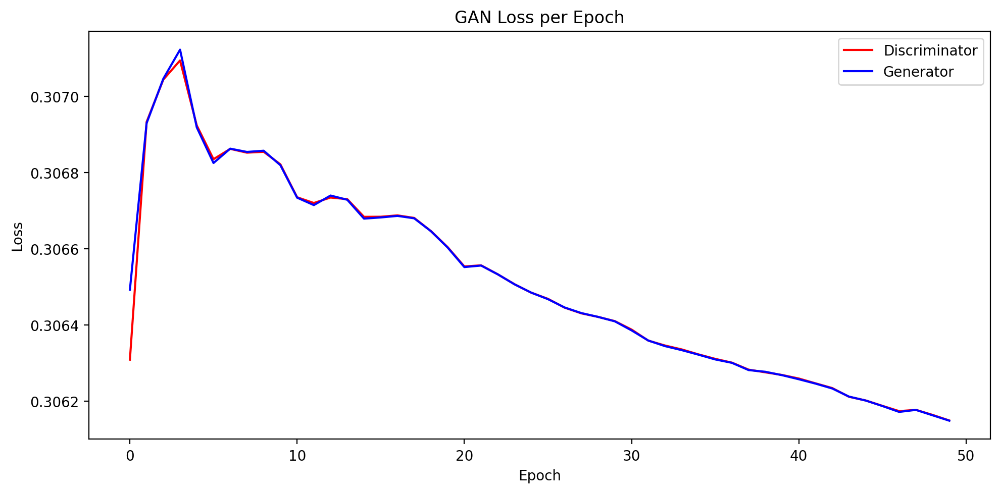

Loss plot saved at 'Result/GAN_Loss_per_Epoch_final.png'


In [ ]:
model.plot_loss()